In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [2]:
#!wget -q https://raw.githubusercontent.com/robertoalotufo/ia368z/master/PyTorch/lib/pytorch_trainer_v2.py -Plib/

In [102]:
import os
import json
import pathlib
import urllib
from collections import defaultdict, OrderedDict
import copy

import numpy as np
import cv2
import matplotlib.pyplot as plt
from matplotlib import patches, patheffects

import torch
from torch import nn
from torch.utils.data import Dataset, Subset, DataLoader
import torchvision
from torchvision import models

from lib import pytorch_trainer_v2 as ptt


## VOC 2007 Dataset

Seguindo o notebook `pascal.ipynb` do `fastai`.

Arquivos baixados e extraídos:

- Dataset: [http://host.robots.ox.ac.uk/pascal/VOC/voc2007/VOCtrainval_06-Nov-2007.tar](http://host.robots.ox.ac.uk/pascal/VOC/voc2007/VOCtrainval_06-Nov-2007.tar)
- Anotações em JSON: [https://storage.googleapis.com/coco-dataset/external/PASCAL_VOC.zip](https://storage.googleapis.com/coco-dataset/external/PASCAL_VOC.zip)

In [8]:
PATH = pathlib.Path('.')

In [9]:
#!wget http://host.robots.ox.ac.uk/pascal/VOC/voc2007/VOCtrainval_06-Nov-2007.tar

In [11]:
#!tar -xvf VOCtrainval_06-Nov-2007.tar

In [10]:
#!wget https://storage.googleapis.com/coco-dataset/external/PASCAL_VOC.zip

In [24]:
#!unzip -n PASCAL_VOC.zip; mv PASCAL_VOC/*.json VOCdevkit/

In [25]:
list(PATH.iterdir())

[PosixPath('PASCAL_VOC.zip'),
 PosixPath('f116735 - VOC Detection v3.ipynb'),
 PosixPath('PASCAL_VOC'),
 PosixPath('.ipynb_checkpoints'),
 PosixPath('lib'),
 PosixPath('VOC Detection.ipynb'),
 PosixPath('.models'),
 PosixPath('VOCtrainval_06-Nov-2007.tar'),
 PosixPath('Untitled1.ipynb'),
 PosixPath('Untitled.ipynb'),
 PosixPath('VOCdevkit'),
 PosixPath('f116735 - VOC Detection.ipynb')]

In [26]:
VOC_PATH = pathlib.Path(PATH/'VOCdevkit')
list(VOC_PATH.iterdir())

[PosixPath('VOCdevkit/pascal_val2007.json'),
 PosixPath('VOCdevkit/pascal_test2007.json'),
 PosixPath('VOCdevkit/pascal_train2007.json'),
 PosixPath('VOCdevkit/VOC2007'),
 PosixPath('VOCdevkit/pascal_train2012.json'),
 PosixPath('VOCdevkit/pascal_val2012.json')]

## Função `open_image` do fast.ai

Utiliza OpenCV que chega é mais rápida que PIL, matplotlib etc.

**OBS: Removida a conversão para np.float32 e divisão por 255. A imagem retornada é uint8 com range [0, 255], para não conflitar com a transformação ToTensor() do pacote torchvision, que também realiza a divisão por 255.**

In [27]:
def open_image(fn):
    """ Opens an image using OpenCV given the file path.

    Arguments:
        fn: the file path of the image

    Returns:
        The image in RGB format as numpy array of floats normalized to range between 0.0 - 1.0
    """
    flags = cv2.IMREAD_UNCHANGED+cv2.IMREAD_ANYDEPTH+cv2.IMREAD_ANYCOLOR
    if not os.path.exists(fn) and not str(fn).startswith("http"):
        raise OSError('No such file or directory: {}'.format(fn))
    elif os.path.isdir(fn) and not str(fn).startswith("http"):
        raise OSError('Is a directory: {}'.format(fn))
    else:
        #res = np.array(Image.open(fn), dtype=np.float32)/255
        #if len(res.shape)==2: res = np.repeat(res[...,None],3,2)
        #return res
        try:
            if str(fn).startswith("http"):
                req = urllib.urlopen(str(fn))
                image = np.asarray(bytearray(req.read()), dtype="uint8")
                im = cv2.imdecode(image, flags)#.astype(np.float32)/255
            else:
                im = cv2.imread(str(fn), flags)#.astype(np.float32)/255
            if im is None: raise OSError(f'File not recognized by opencv: {fn}')
            return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        except Exception as e:
            raise OSError('Error handling image at: {}'.format(fn)) from e

## Funções para plotar imagens

Retiradas diretamente do notebook `pascal.ipynb`

In [28]:
def show_img(im, figsize=None, ax=None):
    if not ax: fig,ax = plt.subplots(figsize=figsize)
    ax.imshow(im)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    return ax

In [29]:
def draw_outline(o, lw):
    o.set_path_effects([patheffects.Stroke(
        linewidth=lw, foreground='black'), patheffects.Normal()])

In [30]:
def draw_rect(ax, b):
    patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor='white', lw=2))
    draw_outline(patch, 4)

In [31]:
def draw_text(ax, xy, txt, sz=14):
    text = ax.text(*xy, txt,
        verticalalignment='top', color='white', fontsize=sz, weight='bold')
    draw_outline(text, 1)

### Funções que englobam as anteriores

- `draw_im`: recebe um array de uma imagem e as anotações dela. Mostra a imagem e todos os bounding boxes.

- `draw_idx`: recebe um ID de imagem. Abre a imagem correspondente e chama `draw_im`.

## Classe Dataset

In [448]:
class VOC2007(Dataset):
    def __init__(self, voc_path, train=True, test=False, transform=None, skip_tests=True, normalize_bbox=False):
        
        if not isinstance(voc_path, pathlib.Path):
            voc_path = pathlib.Path(voc_path)
        if not voc_path.exists() or not voc_path.is_dir():
            raise OSError("`voc_path` should be an existing directory.")
        # Paths and tring constants
        self.voc_path = voc_path
        self.IMG_PATH = (VOC_PATH/'VOC2007'/'JPEGImages')
        
        IMAGES, ANNOTATIONS, CATEGORIES = 'images', 'annotations', 'categories'
        FILE_NAME, ID, IMG_ID, CAT_ID, BBOX = 'file_name', 'id', 'image_id', 'category_id', 'bbox'
        
        # Load correct json
        if train:
            jfname = 'pascal_train2007.json'
        elif test:
            jfname = 'pascal_test2007.json'
        else:
            # valid
            jfname = 'pascal_val2007.json'
        self.inp_j = inp_j = json.load((VOC_PATH/jfname).open())
        
        # Dict category id -> category name. Id in [0, 19]
        self.cats = {cat[ID]-1: cat['name'] for cat in trn_j[CATEGORIES]}
        # Image IDs are non-consecutive
        self.ids = {ix: img[ID] for ix, img in enumerate(inp_j[IMAGES])}
        self.img_dicts = {img[ID]: img for img in inp_j[IMAGES]}
        
        # Image paths
        self.img_paths = {}
        for img in inp_j[IMAGES]:
            self.img_paths[img[ID]] = self.IMG_PATH / img[FILE_NAME]
        
        self.normalize_bbox = normalize_bbox
        # y_anno: dict (image_id -> list(tuple(normalized bounding box, category id))
        y_anno = defaultdict(list)
        for anno in inp_j[ANNOTATIONS]:
            img_id = anno[IMG_ID]
            img_dict = self.img_dicts[img_id]
            h, w = img_dict['height'], img_dict['width']
            if not anno['ignore']:
                if self.normalize_bbox:
                    bb = self.hw_bb_norm(anno[BBOX], h, w)
                else:
                    bb = self.hw_bb(anno[BBOX])
                y_anno[anno[IMG_ID]].append((bb, anno[CAT_ID]-1))
        self.y_anno = y_anno
        
        self.transform = transform
        
        # Run assertion tests
        if not skip_tests:
            self.tests()
        
    
    def get_num_classes(self):
        return len(self.cats)
    
    @staticmethod
    def hw_bb(bb):
        """Converte BBOX de (top-left/height/width) para (top-left/bottom-right). """
        return np.array([bb[1], bb[0], bb[3]+bb[1]-1, bb[2]+bb[0]-1], dtype=np.float32)
    
    def hw_bb_norm(self, bb, height, width):
        """Similar a hw_bb, mas normaliza as coordenadas entre [0, 1]. """
        h, w = height, width
        bb = self.hw_bb(bb) 
        bb[0] /= h
        bb[2] /= h
        bb[1] /= w
        bb[3] /= w
        return bb
        
    @staticmethod
    def bb_hw(bb):
        """Reverses hw_bb: bbox top-left/bottom-right to top-left/height-width. """
        return np.array([bb[1], bb[0], bb[3]-bb[1]+1, bb[2]-bb[0]+1], dtype=np.float32)
    
    def bb_hw_denorm(self, bb, height, width):
        """Undoes hw_bb_norm operations. """
        h, w = height, width
        bb = self.denorm(bb, height, width)
        bb = self.bb_hw(bb) 
        return bb
    
    def denorm(self, bb, height, width):
        bb[0] *= height
        bb[2] *= height
        bb[1] *= width
        bb[3] *= width
        return bb

    
    def draw_im(self, im, bbox, cat, ax=None):
        ax = show_img(im, figsize=(16,8), ax=ax)
        
        bbox = self.bb_hw(bbox)
        draw_rect(ax, bbox)
        x, y = copy.deepcopy(bbox[:2])
        x += bbox[2]/3
        draw_text(ax, (x, y), self.cats[cat], sz=16)
        return ax
    
    def draw_idx(self, ix, ax=None):
        sample = self[ix]
        self.draw_sample(sample, ax=ax)
        
    
    def draw_sample(self, sample, ax=None):
        im = sample['image']
        bbox = sample['bbox']
        cat = sample['category']
        
        H, W, _ = im.shape
        if self.normalize_bbox:
            bbox = self.denorm(bbox, H, W)
        ax = self.draw_im(im, bbox, cat, ax=ax)
        ax.set_title(f'({H}, {W})')
    

    def tests(self):
        """Tests to ensure data is within expected values."""
        # Test bounding boxes values
        for annots in self.y_anno.values():
            for anno in annots:
                bbox = anno[0]
                category = anno[1]
                assert (bbox >= 0).all() and (bbox <= 1).all()
                assert (0 <= category < self.get_num_classes())
                
        # Test bounding box normalization and denorm
        orig_anno = self.inp_j['annotations'][0]
        orig_hw_bbox = np.asarray(orig_anno['bbox'], dtype=np.float32)
        img_id = orig_anno['image_id']
        img_dict = self.img_dicts[img_id]
        img_height = img_dict['height']
        img_width = img_dict['width']
        
        img, anno = self[0]
        H, W = img.shape[:2]
        assert (H == img_height and W == img_width)
        norm_bb, cat = anno[0]
        
        denorm_bb = self.bb_hw_denorm(norm_bb, H, W)
        assert (denorm_bb == orig_hw_bbox).all()
        
        print('Tests passed.')
        
    @staticmethod
    def get_biggest_bbox(annotations):
        """ Returns only the annotation of the biggest bounding box. """
        if len(annotations) == 1:
            return annotations[0]

        biggest = None
        max_area = float('-inf')
        for anno in annotations:
            x0, y0, x1, y1 = anno[0]
            area = (x1-x0) * (y1-y0)
            if area > max_area:
                max_area = area
                biggest = anno
        return biggest

        
    def __len__(self):
        return len(self.ids)
    
    def __getitem__(self, ix):
        img_id = self.ids[ix]
        img = open_image(self.img_paths[img_id])
        annotations = copy.deepcopy(self.y_anno[img_id])
        biggest_anno = self.get_biggest_bbox(annotations)

        sample = {'image': img, 
                  'bbox': biggest_anno[0],
                  'category': biggest_anno[1]}
        if self.transform:
            sample = self.transform(sample)
       
        return sample

In [449]:
trn_ds = VOC2007(VOC_PATH, train=True)

val_ds = VOC2007(VOC_PATH, train=False)

# Checa se os IDs de imagens dos datasets de treino e de validação são todos diferentes
print('Train e Valid IDs are disjoint? ', set(trn_ds.ids.values()).isdisjoint(set(val_ds.ids.values())))

Train e Valid IDs are disjoint?  True


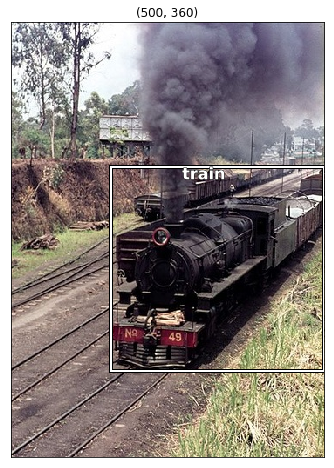

In [450]:
trn_ds.draw_idx(6)

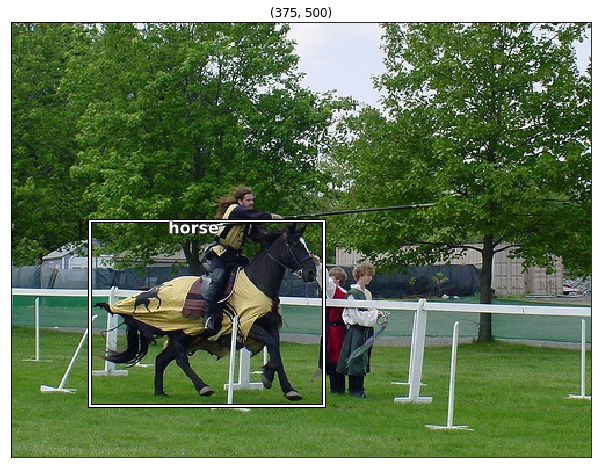

In [429]:
val_ds.draw_idx(2)

## Transformações

Classes adaptadas do tutorial [Data Loading and Processing](https://pytorch.org/tutorials/beginner/data_loading_tutorial.html).


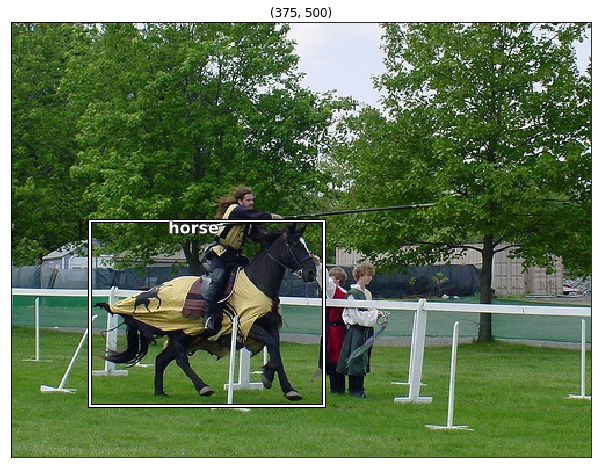

In [484]:
val_ds.draw_idx(2)

In [485]:
sample = val_ds[2]
img = sample['image']
bbox = sample['bbox']
print(bbox)

[171.  68. 329. 269.]


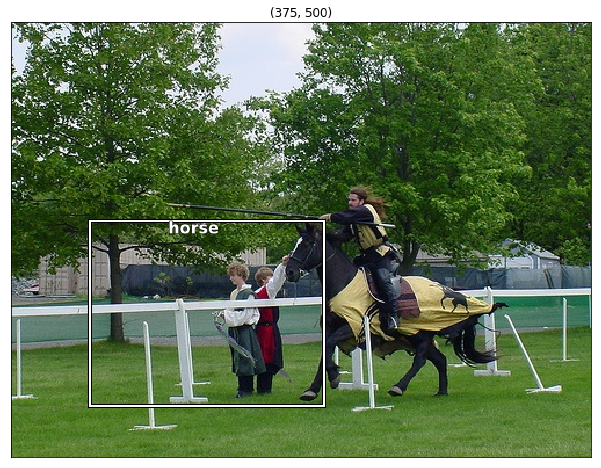

In [486]:
img = img[:, ::-1]
sample['image'] = img
val_ds.draw_sample(sample)

In [492]:
bbox[3::-2]

array([269.,  68.], dtype=float32)

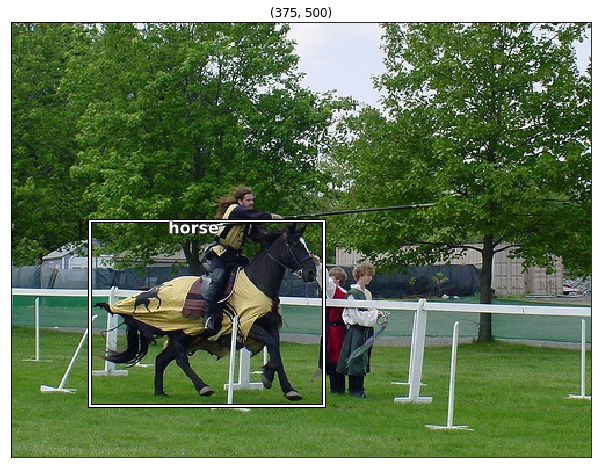

In [478]:
val_ds.draw_sample(sample)

In [499]:
class SmallerSideSquareCrop:
    
    def __init__(self, verbose=False):
        self.verbose = verbose
    
    def __call__(self, sample):
        img = sample['image']
        bbox = sample['bbox']
        
        h, w = img.shape[:2]
        factor = np.random.ranf()
        
        if h < w:
            delta = int(factor * (w - h))
            if self.verbose: print('delta:', delta)
            img = img[:, delta:delta+h]
            sample['image'] = img

            bbox = sample['bbox']
            if self.verbose: print('initial bbox:', bbox)
            bbox[1::2] = (bbox[1::2] - delta).clip(0, h)
            if self.verbose: print('final bbox:', bbox)
            sample['bbox'] = bbox
            
        elif h > w:
            factor = np.random.ranf()
            # factor = 0.5
            delta = int(factor * (h - w))
            if self.verbose: print('delta:', delta)
            img = img[delta:delta+w, :]
            sample['image'] = img

            bbox = sample['bbox']
            if self.verbose: print('initial bbox:', bbox)
            bbox[0::2] = (bbox[0::2] - delta).clip(0, w)
            if self.verbose: print('final bbox:', bbox)
            sample['bbox'] = bbox
            
        return sample

class Rescale(object):
    """Rescale the image in a sample to a given size.

    Args:
        output_size (tuple or int): Desired output size. If tuple, output is
            matched to output_size. If int, smaller of image edges is matched
            to output_size keeping aspect ratio the same.
    """

    def __init__(self, output_size):
        assert isinstance(output_size, (int, tuple))
        self.output_size = output_size

    def __call__(self, sample):
        image, bbox = sample['image'], sample['bbox']

        h, w = image.shape[:2]
        if isinstance(self.output_size, int):
            if h > w:
                new_h, new_w = self.output_size * h / w, self.output_size
            else:
                new_h, new_w = self.output_size, self.output_size * w / h
        else:
            new_h, new_w = self.output_size

        new_h, new_w = int(new_h), int(new_w)

        img = transform.resize(image, (new_h, new_w))

        # h and w are swapped for landmarks because for images,
        # x and y axes are axis 1 and 0 respectively
        landmarks = landmarks * [new_w / w, new_h / h]

        return {'image': img, 'landmarks': landmarks}


class RandomCrop(object):
    """Crop randomly the image in a sample.

    Args:
        output_size (tuple or int): Desired output size. If int, square crop
            is made.
    """

    def __init__(self, output_size):
        assert isinstance(output_size, (int, tuple))
        if isinstance(output_size, int):
            self.output_size = (output_size, output_size)
        else:
            assert len(output_size) == 2
            self.output_size = output_size

    def __call__(self, sample):
        image, landmarks = sample['image'], sample['landmarks']

        h, w = image.shape[:2]
        new_h, new_w = self.output_size

        top = np.random.randint(0, h - new_h)
        left = np.random.randint(0, w - new_w)

        image = image[top: top + new_h,
                      left: left + new_w]

        landmarks = landmarks - [left, top]

        return {'image': image, 'landmarks': landmarks}


class RandomHorizontalFlip:
    def __init__(self, p):
        if not isinstance(p, float):
            raise TypeError('`p` should be float.')
        elif not 0 <= p <= 1:
            raise ValueError('`p` should in [0, 1].')
        self.p = p
        
    def __call__(self, sample):
        
        prob = np.random.ranf()
        if self.p > prob:
            img = sample['image']
            bbox = sample['bbox']
            
            h, w = img.shape[:2]
            img[:, :] = img[:, ::-1]
            bbox[1::2] = w - bbox[3::-2]
            
#             sample['image'] = img
#             sample['bbox'] = bbox
        
        return sample
        
        

class ToTensor(object):
    """Convert ndarrays in sample to Tensors."""

    def __call__(self, sample):
        image, landmarks = sample['image'], sample['landmarks']

        # swap color axis because
        # numpy image: H x W x C
        # torch image: C X H X W
        image = image.transpose((2, 0, 1))
        return {'image': torch.from_numpy(image),
                'landmarks': torch.from_numpy(landmarks)}

In [505]:
A = np.arange(9).reshape((3,3))
for row in A:
    for ax in row:
        print(ax)

0
1
2
3
4
5
6
7
8


[2347, 2347, 1954, 1954, 1883, 1883, 1437, 1437, 134, 134, 540, 540, 608, 608, 378, 378]


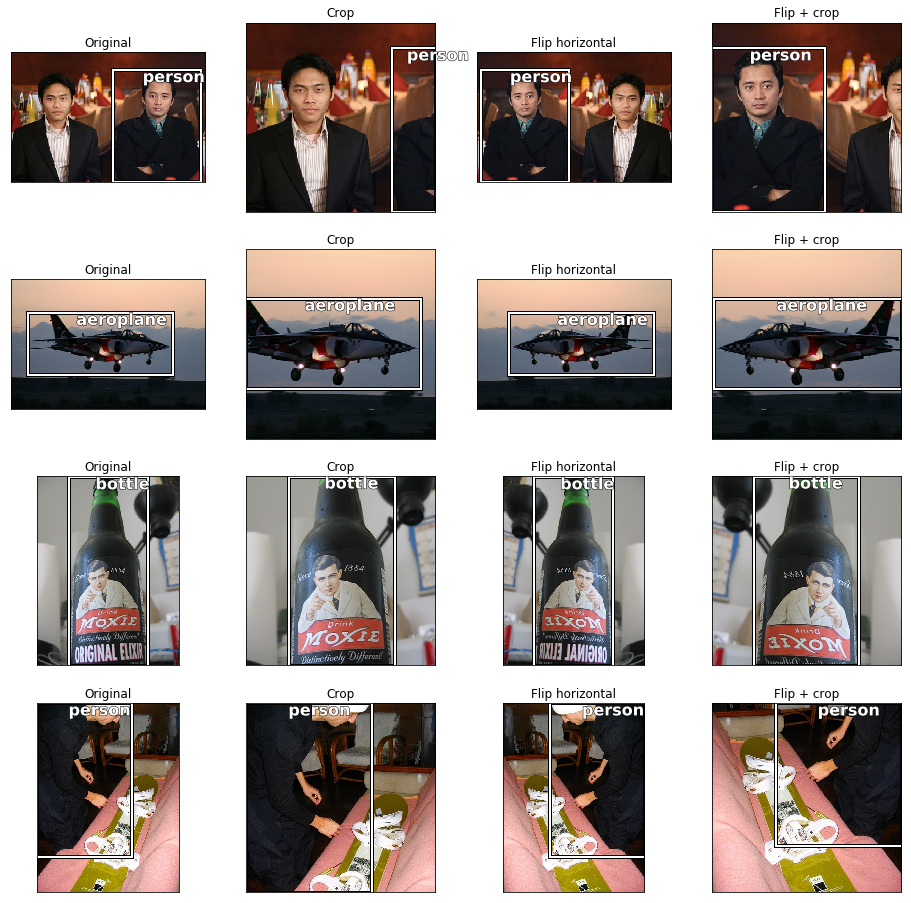

In [511]:
import random
import itertools
N_images = 16

# new_ixs = [ixs[i//2] for i in range(2*len(ixs))]
print(new_ixs)
ncols = 4
nrows = int(np.ceil(N_images/ncols))

ixs = random.sample(range(len(trn_ds)), int(nrows))

fig, axs = plt.subplots(nrows, ncols, figsize=(ncols*4, nrows*4))
for i, row in enumerate(axs):
    for n, ax in enumerate(row):
        sample = trn_ds[ixs[i]]
        if n == 0:
            title= ('Original')
        if n == 1:
            title = ('Crop')
            sample = SmallerSideSquareCrop()(sample)
        if n == 2:
            title = ('Flip horizontal')
            sample = RandomHorizontalFlip(1.)(sample)
        if n == 3:
            title = ('Flip + crop')
            sample = SmallerSideSquareCrop()(RandomHorizontalFlip(1.)(sample))
        trn_ds.draw_sample(sample, ax=ax)
        ax.set_title(title)

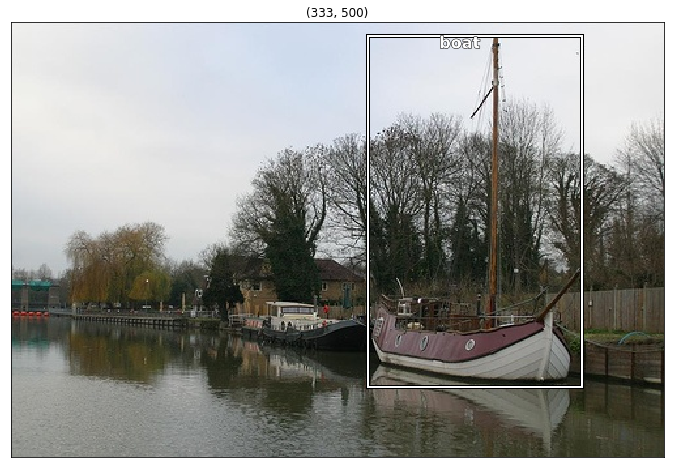

In [498]:
trn_ds.draw_idx(13)

## Definição do modelo

In [103]:
class MyModel(nn.Module):
    """ Model that classifies the biggest bounding box of the image and
        predicts its bounding box. """
    def __init__(self, num_classes, bbox_only=False, class_only=False):
        super().__init__()
        # ResNet 34 without Avg pooling and FC layer
#         self.convs = models.resnet.resnet34(pretrained=True)
        tmp_resnet = models.resnet.resnet34(pretrained=True)
        # Remove last two layers: Avg pooling and Dense
        resnet_layers = OrderedDict(list(tmp_resnet.named_children())[:-2])
        fc_in_features = tmp_resnet.fc.in_features * (7*7)
        del tmp_resnet
        self.convs = nn.Sequential(resnet_layers)
#         
#         del self.convs.avgpool
#         del self.convs.fc
#         self.convs.avgpool = lambda x: x
#         self.convs.fc = lambda x: x
        self.fc = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(fc_in_features, 256),
            nn.ReLU(inplace=True),
            nn.BatchNorm1d(256),
            nn.Dropout(0.5),
        )
        self.classifier = nn.Linear(256, num_classes)
        self.bbox_regressor = nn.Linear(256, 4)
        
        self.bbox_only = bbox_only
        self.class_only = class_only

    @classmethod
    def from_dataset(cls, dataset, *args, **kwargs):
        return cls(dataset.get_num_classes(), *args, **kwargs)
    
    def freeze_resnet(self, idx=None):
        
        for layer_name, p in self.named_parameters():
            if layer_name.startswith('convs'):
                p.requires_grad = False
    
    def freeze_to(self, ix):
        pass
    
    def bottleneck_features(self, x):
        x = self.convs(x)
        return x.view(x.size(0), -1)
    
    def forward(self, x):
        x = self.bottleneck_features(x)
        x = self.fc(x)
        y_cat = self.classifier(x)
        bbox = torch.sigmoid(self.bbox_regressor(x))
        
        if self.bbox_only:
            return bbox
        elif self.class_only:
            return y_cat
        return y_cat, bbox

In [104]:
model = MyModel.from_dataset(trn_ds)#, bbox_only=True)

In [105]:
model

MyModel(
  (convs): Sequential(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_sta

### Testando o predict com entrada aleatória

In [111]:
# Batch size: 5
x = torch.randn((5, 3, 224, 224))

In [112]:
model.eval()
cat, bbox = model(x)
print(cat.size(), bbox.size())
model = model.train()

torch.Size([5, 20]) torch.Size([5, 4])


In [110]:
# model.eval()
# bbox = model(x)
# bbox.size()

## Limitando o Dataset para apenas o maior bounding box da imagem

In [123]:
class BiggestBBoxAndCategory:
    def __init__(self):
        pass
    def __call__(self, img, anns):
        ann = get_biggest_bbox(anns)
#         bb, cat = ann[0]
#         cat = torch.LongTensor([cat])
#         bb = torch.as_tensor(bb, dtype=torch.float32)
        return img, (bb, cat)

In [128]:
trn_ds_big = VOC2007(VOC_PATH, train=True, transform=BiggestBBoxAndCategory())# get_biggest_bbox)

In [125]:
%debug

> <ipython-input-96-70650b03c3bb>(131)tests()
    129         H, W = img.shape[:2]
    130         assert (H == img_height and W == img_width)
--> 131         norm_bb, cat = anno[0]
    132 
    133         denorm_bb = self.bb_hw_denorm(norm_bb, H, W)



ipdb>  l


    126         img_width = img_dict['width']
    127 
    128         img, anno = self[0]
    129         H, W = img.shape[:2]
    130         assert (H == img_height and W == img_width)
--> 131         norm_bb, cat = anno[0]
    132 
    133         denorm_bb = self.bb_hw_denorm(norm_bb, H, W)
    134         assert (denorm_bb == orig_hw_bbox).all()
    135 
    136         print('Tests passed.')



ipdb>  img.shape


(333, 500, 3)


ipdb>  anno


(tensor([0.2883, 0.3100, 0.8078, 0.7000]), tensor([6]))


ipdb>  q


### Comparando os datasets: original e maior bbox

In [129]:
trn_ds[1][1]

[(array([0.16758242, 0.38333333, 0.54395604, 0.57916665], dtype=float32), 14),
 (array([0.21153846, 0.18541667, 0.9203297 , 0.8375    ], dtype=float32), 12)]

In [130]:
trn_ds_big[1][1]

(tensor([0.2115, 0.1854, 0.9203, 0.8375]), tensor([12]))

281 500
[(array([ 77., 103., 182., 374.], dtype=float32), 0), (array([ 87., 132., 122., 196.], dtype=float32), 0), (array([179., 194., 228., 212.], dtype=float32), 14), (array([188.,  25., 237.,  43.], dtype=float32), 14)]


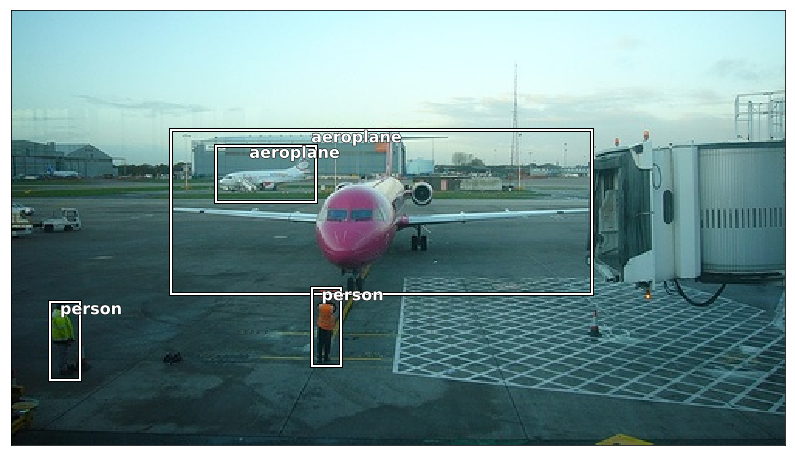

In [131]:
trn_ds.draw_idx(4)

In [132]:
trn_ds_big.draw_idx(4)

281 500


/home/fabiocapsouza/anaconda3/envs/pytorch0.4/lib/python3.6/site-packages/ipykernel/__main__.py:85: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


RuntimeError: dimension specified as 0 but tensor has no dimensions

In [133]:
%debug

> <ipython-input-126-fef976d96757>(86)denorm()
     84     def denorm(self, bb, height, width):
     85         bb[0] *= height
---> 86         bb[2] *= height
     87         bb[1] *= width
     88         bb[3] *= width



ipdb>  vv


*** NameError: name 'vv' is not defined


ipdb>  bb


tensor(77.)


ipdb>  height


281


ipdb>  width


500


ipdb>  q


## Treinamento

### Transforms

In [349]:
x, y = trn_ds[0]

In [350]:
y

[(array([0.2882883, 0.31     , 0.8078078, 0.7      ], dtype=float32), 6)]

In [351]:
BiggestBBoxAndCategory()(y)

(tensor([6]), tensor([0.2883, 0.3100, 0.8078, 0.7000]))

In [352]:
x_transform = torchvision.transforms.Compose([
    torchvision.transforms.ToPILImage(),
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.ColorJitter(brightness=0.15, saturation=0.15, contrast=0.15),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225]),
])

y_transform = torchvision.transforms.Compose([
    # get_biggest_bbox,
#     torchvision.transforms.Lambda(lambda y: y[0][0]), # Get bbox only, ignore category
#     torchvision.transforms.ToTensor(),
    BiggestBBoxAndCategory(),
])

In [353]:
# Subset para testar com 200 amostras
# trn_ds_big = Subset(VOC2007(VOC_PATH, train=True, transform=x_transform, y_transform=y_transform), list(range(200)))
# val_ds_big = Subset(VOC2007(VOC_PATH, train=False, test=False, transform=x_transform, y_transform=y_transform), list(range(200)))

In [354]:
trn_ds_big = VOC2007(VOC_PATH, train=True, transform=x_transform, y_transform=y_transform)
val_ds_big = VOC2007(VOC_PATH, train=False, test=False, transform=x_transform, y_transform=y_transform)

In [355]:
x, y = trn_ds_big[0]
print(len(trn_ds_big))
print(x.shape)
print(y)

2501
torch.Size([3, 224, 224])
(tensor([6]), tensor([0.2883, 0.3100, 0.8078, 0.7000]))


In [356]:
x, y = val_ds_big[0]
print(len(val_ds_big))
print(x.shape)
print(y)

2510
torch.Size([3, 224, 224])
(tensor([8]), tensor([0.7013, 0.3280, 0.9893, 0.5040]))


### Função de Loss combinada para utilizar no Trainer

In [359]:
class CombinedCEandL1(nn.:
    def __init__(self, weights=None):
        self.cross_ent = nn.CrossEntropyLoss()
        self.l1_loss = nn.L1Loss()
        
        if weights is None:
            weights = torch.tensor([1.0, 1.0])
        self.weights = nn.buffer(weights
        
    def __call__(self, inputs, targets):
        # assert inputs[0].size(1) == 20
        # assert inputs[1].size(1) == 4
        cat_pred = inputs[0]
        # Categories are returned as tensor with size (batch_size, 1)
        cat_tgt = targets[0].squeeze(1)
        bb_pred = inputs[1]
        bb_tgt = targets[1]
        categ_loss = self.cross_ent(cat_pred, cat_tgt)
        bb_loss = self.l1_loss(bb_pred, bb_tgt)
        return self.weights[0]*categ_loss + self.weights[1]*bb_loss

### DataLoaders

In [360]:
trn_dl = torch.utils.data.DataLoader(trn_ds_big, batch_size=64, shuffle=True, num_workers=4)
val_dl = torch.utils.data.DataLoader(val_ds_big, batch_size=64, shuffle=False, num_workers=4)

In [361]:
X, Y = next(iter(trn_dl))
print("X size, min, max")
print(X.size(), X.min(), X.max())
print('')
print(f"len(Y): {len(Y)}")
print('Classes Y[0]', Y[0].size(), Y[0].type(), Y[0].min(), Y[0].max())
print('BBoxes Y[1]', Y[1].size(), Y[1].type(), Y[1].min(), Y[1].max())

X size, min, max
torch.Size([64, 3, 224, 224]) tensor(-2.1179) tensor(2.6400)

len(Y): 2
Classes Y[0] torch.Size([64, 1]) torch.LongTensor tensor(0) tensor(19)
BBoxes Y[1] torch.Size([64, 4]) torch.FloatTensor tensor(0.) tensor(0.9980)


In [362]:
dls = {'train': trn_dl, 'valid': val_dl}
for setname, dl in dls.items():
    print(setname)
    for X, Y in dl:
        assert X.shape[2:] == (224, 224)
        cats = Y[0].numpy()
        bbs = Y[1].numpy()
        assert (0 <= cats).all()
        assert (cats < trn_ds.get_num_classes()).all()
        assert (bbs.min() >= 0).all()
        assert (bbs.max() <= 1).all()

train
valid


### Testando a função de custo

In [363]:
yp = model(X[0:2])

In [364]:
yp

(tensor([[-0.1376, -0.0326, -0.7268, -0.1451, -0.0985,  0.2977,  0.1082,  0.6141,
          -0.1799,  0.2357,  0.3735,  0.1653,  0.1184, -0.7964,  0.5171,  0.2320,
          -0.5679, -0.5095,  0.0001, -0.3486],
         [ 0.4178,  0.3239,  0.5661,  0.1441,  0.2454, -0.1624, -0.0294,  0.2730,
          -0.8549, -0.0773, -0.1626,  0.0042, -0.0079,  0.7539, -0.0001, -0.0894,
           0.8394,  0.3955,  0.2280,  0.3643]], grad_fn=<ThAddmmBackward>),
 tensor([[0.5790, 0.6304, 0.4445, 0.6694],
         [0.4860, 0.6476, 0.4335, 0.4754]], grad_fn=<SigmoidBackward>))

In [366]:
weights = torch.tensor([1., 224.])
CombinedCEandL1(weights=weights)(yp, (Y[0][:2], Y[1][:2]))

tensor(66.5778, grad_fn=<ThAddBackward>)

In [133]:
# %debug

### Trainer

In [368]:
model = MyModel.from_dataset(trn_ds_big)
model.freeze_resnet()

In [140]:
torch.cuda.max_memory_allocated(0)/1e6

750.1056

In [372]:
n_epochs = 10
# Alter devname to use cpu or gpu
devname = 0
optm = torch.optim.Adam(params=model.parameters(), lr=5.e-3, betas=(0.9, 0.999))
schd = torch.optim.lr_scheduler.StepLR(optm, step_size=4, gamma=0.75)
cb_chkpt = ptt.ModelCheckpoint('.models/voc_biggest_bbox', reset=True, verbose=1, load_best=True)

# Defining weights for CE loss and L1Loss
loss_weights = torch.tensor([1., 224.]).to(devname)
criterion = CombinedCEandL1(weights=loss_weights)

trainer_dens = ptt.DeepNetTrainer(model         = model,
                                  criterion     = criterion,
                                  optimizer     = optm,
                                  lr_scheduler  = schd,
                                  devname       = devname,
                                  callbacks = [ptt.PrintCallback(), 
                                               cb_chkpt])

In [373]:
trainer_dens.fit_loader(n_epochs, trn_dl, val_dl)

Start training for 10 epochs
  1:  13.0s   T: 0.68245 *   V: 0.47748 *  
  2:  13.2s   T: 0.44791 *   V: 0.44298 *  
  3:  13.2s   T: 0.41107 *   V: 0.43688 *  
  4:  13.1s   T: 0.38957 *   V: 0.43852    
  5:  13.1s   T: 0.37143 *   V: 0.43716    
  6:  12.9s   T: 0.36537 *   V: 0.43114 *  
  7:  12.8s   T: 0.35369 *   V: 0.43202    
  8:  12.9s   T: 0.34664 *   V: 0.43568    
  9:  13.2s   T: 0.33713 *   V: 0.42805 *  
 10:  13.0s   T: 0.33180 *   V: 0.43666    
Stop training at epoch: 10/10
Best model was saved at epoch 9 with loss 0.42805: .models/voc_biggest_bbox
Model loaded from .models/voc_biggest_bbox.model


### Analisando performance

In [402]:
model = model.eval()

In [399]:
correct = 0

for X, Y in val_dl:
    X = X.to(devname)
    Y = [y.to(devname) for y in Y]
    Ypprob, Ypbb = model(X)
    
    Ypcat = torch.argmax(Ypprob, dim=1)
    correct += (Ypcat == Y[0].squeeze(1)).sum().item()

print("Acurácia de classificação: {:.2%}".format(correct/len(val_ds)))

Acurácia de classificação: 74.94%


## Visualizando resultados

In [408]:
def show_prediction(x, y, ax=None):
    
    # import pdb; pdb.set_trace()
    # Clone tensors to avoid problems with multiple executions
    x = x.clone()
    cat = y[0].clone()
    bb = y[1].clone()
    
    # Denormalize
    mean = torch.tensor([0.485, 0.456, 0.406]).unsqueeze(1).unsqueeze(1)
    std = torch.tensor([0.229, 0.224, 0.225]).unsqueeze(1).unsqueeze(1)
    x *= std
    x += mean
    # print(x.min(), x.max())
    x = x.data.numpy().transpose(1,2,0)
    
    cat = torch.argmax(cat).cpu().item()
    bb = bb.cpu().data.numpy()
    bb *= 224
    anns = [(bb, cat)]
    
    # import pdb; pdb.set_trace()
    draw_im(x, anns, dataset=val_ds, ax=ax)

### Conj de treinamento

In [409]:
X, Y = next(iter(trn_dl))

In [410]:
model = model.eval()
Yp = model(X.cuda())
print(Yp[0].size(), Yp[1].size())
print(Yp[1].min(), Yp[1].max())

torch.Size([64, 20]) torch.Size([64, 4])
tensor(7.0255e-07, device='cuda:0', grad_fn=<MinBackward1>) tensor(1.0000, device='cuda:0', grad_fn=<MaxBackward1>)


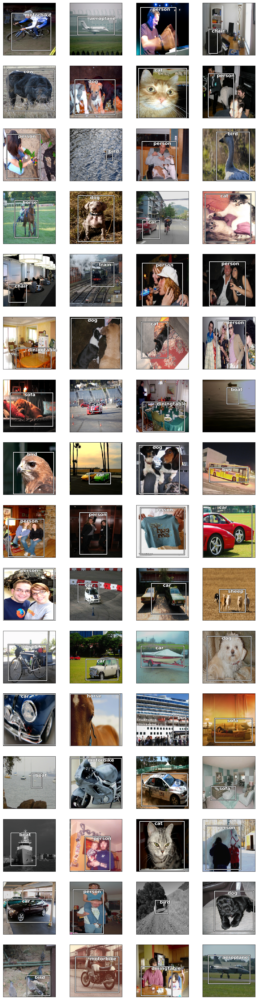

In [411]:
ncols = 4
nrows = int(np.ceil(len(X)/4))
fig, axs = plt.subplots(nrows, ncols, figsize=(ncols*4, nrows*4))

for n, ax in enumerate(axs.ravel()):
    x, y = X[n], (Yp[0][n], Yp[1][n])
    show_prediction(x, y, ax=ax)

### Conj de validação

In [413]:
X, Y = next(iter(val_dl))

In [414]:
Yp = model(X.cuda())
print(Yp[0].size(), Yp[1].size())
print(Yp[1].min(), Yp[1].max())

torch.Size([64, 20]) torch.Size([64, 4])
tensor(0.0060, device='cuda:0', grad_fn=<MinBackward1>) tensor(0.9968, device='cuda:0', grad_fn=<MaxBackward1>)


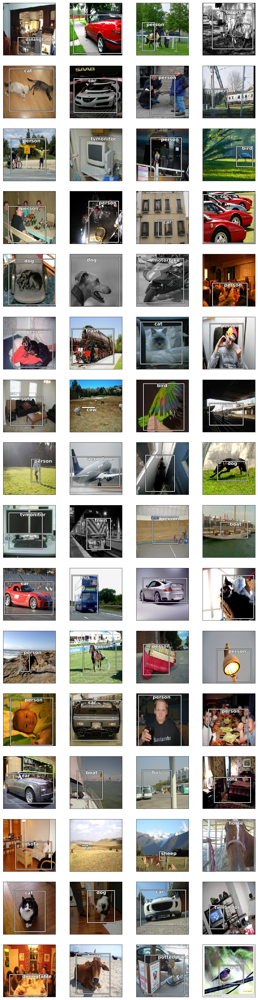

In [415]:
ncols = 4
nrows = int(np.ceil(len(X)/4))
fig, axs = plt.subplots(nrows, ncols, figsize=(ncols*4, nrows*4))

for n, ax in enumerate(axs.ravel()):
    x, y = X[n], (Yp[0][n], Yp[1][n])
    show_prediction(x, y, ax=ax)